## Known Ingredients List


In [ ]:
import kagglehub
import pandas as pd
import os

path = kagglehub.dataset_download("eward96/skincare-products-and-their-ingredients")
print("Downloaded dataset path:", path)

csv_filepath = None
for fname in os.listdir(path):
    if fname.endswith(".csv"):
        csv_filepath = os.path.join(path, fname)
        break

if not csv_filepath:
    raise FileNotFoundError("No CSV found in the downloaded dataset folder.")

print("Using CSV file:", csv_filepath)

df = pd.read_csv(csv_filepath)

100%|██████████| 182k/182k [00:00<00:00, 22.4MB/s]

Extracting files...
Downloaded dataset path: /root/.cache/kagglehub/datasets/eward96/skincare-products-and-their-ingredients/versions/1
Using CSV file: /root/.cache/kagglehub/datasets/eward96/skincare-products-and-their-ingredients/versions/1/skincare_products.csv


In [ ]:
df['ingredients'][1]


'Aqua/Water, Homosalate, Glycerin, Octocrylene, Ethylhexyl, Salicylate, Niacinamide, Silica, Butyl Methoxydibenzoylmethane, Dimethicone, Cetearyl Alcohol, PEG-100 Stearate, Glyceryl Stearate, Phenoxyethanol, Stearic Acid, Behentrimonium Methosulfate, Caprylyl Glycol, Palmitic Acid, Ammonium Polyacryloyldimethyl taurate, Xanthan Gum, Disodium Edta, Tocopherol, Sodium Lauroyl Lactylate, Myristic Acid, Sodium Hyaluronate, Ceramide NP, Ceramide AP, Phytosphingosine, Cholesterol, Cerbomer, Ethylhexyglycerin, Ceramide EOP.'

In [ ]:
import re

unique_ingredients = set()

for ingredient_string in df['ingredients']:
    if not isinstance(ingredient_string, str):
        continue

    splitted = re.split(r'[;,.]', ingredient_string)

    splitted = [ingredient.strip() for ingredient in splitted if ingredient.strip()]

    unique_ingredients.update(splitted)

ingredients_list = sorted(list(unique_ingredients))

print("Unique ingredients:", len(ingredients_list))
print("\n".join(ingredients_list))


Unique ingredients: 5342
(Aqua) Water
(Bergamot) Peel Oil
(CI 77891) Titanium Dioxide
(Ci 77491)
(Ci 77492)
(Ci 77499)
(Eucalyptus) Leaf Oil
(Grapefruit) Seed Extract
(Nat) Aroma
(Orange) Peel Extract
(SD Alcohol 40-B)
(Sweet Almond) Oil
)
+/- [Ci 77891 / Titanium Dioxide
1
1-2-Hexanediol
1-Methylhydantoin-2-Imide
10 –Decanediol
10-Decanediol
10-Hydroxydecanoic Acid
100% Dead Sea Salt
100% Pure Squalane Oil
2
2 Hexanediol
2 Hexanediol & Sodium Hyaluronate & Aqua (Water)
2- Hexanediol
2-Bromo-2-Nitropropane-1
2-Butanediol)-4 PEG/PPG-29/9 Methylglucose
2-Dimethylhydrocinnamal
2-HEXANEDIOL
2-Hexanediol
2-Oleamido-1
2-hexanediol
2-oleamido-1
3-Diol
3-O-Ethyl Ascorbic Acid
3-Octadecanediol
3-octadecanediol
33)
4-Dicarboxylate
4-T-Butylcyclohexanol
6-Dimethyl-7-octen-2-ol
6-Naphthalate
7-Dehydrocholesterol
7-Dehydrocholesterol (Provitamin D3)
8%)
ACACIA DECURRENS FLOWER WAX
ACRYLATES/C10-30 ALKYL ACRYLATE CROSSPOLYMER
ALLANTOIN
ALOE BARBADENSIS LEAF EXTRACT
ALPHA-ISOMETHYL IONONE
ALUMINA
AMM

In [ ]:
import json

with open("known_ingredients.json", "w") as f:
    json.dump(ingredients_list, f)


## OCR

In [ ]:
!pip install easyocr
!pip install Pillow

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.9/2.9 MB 41.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 1.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 111.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 85.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 52.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 779.9 kB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 12.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 80.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 422.8/422.8 kB 32.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [ ]:
import easyocr
import cv2
import numpy as np
import re
from difflib import get_close_matches
from google.colab import files
from IPython.display import Image, display
from google.colab.patches import cv2_imshow


Saving WhatsApp Image 2025-02-18 at 23.06.01.jpeg to WhatsApp Image 2025-02-18 at 23.06.01 (1).jpeg
Uploaded image: WhatsApp Image 2025-02-18 at 23.06.01 (1).jpeg


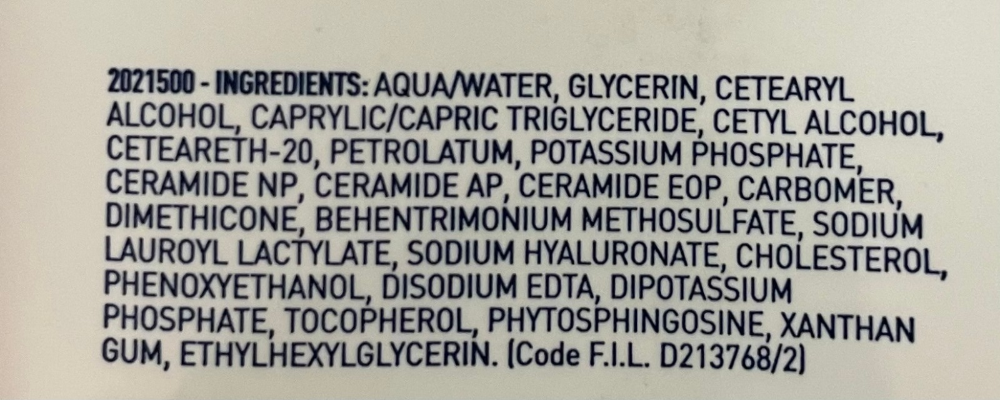

In [ ]:
uploaded = files.upload()

img_filename = list(uploaded.keys())[0]
print(f"Uploaded image: {img_filename}")
display(Image(filename=img_filename))


In [ ]:
def show_image(title, img):
    print(title)
    cv2_imshow(img)
    print("Shape:", img.shape, "\n")

In [ ]:
def unsharp_mask(image, kernel_size=(5,5), sigma=1.0, amount=1.5, threshold=0):
    blurred = cv2.GaussianBlur(image, kernel_size, sigma)
    sharpened = float(amount+1) * image - float(amount) * blurred
    sharpened = np.maximum(sharpened, np.zeros(sharpened.shape))
    sharpened = np.minimum(sharpened, 255*np.ones(sharpened.shape))
    sharpened = sharpened.round().astype(np.uint8)
    if threshold > 0:
        low_contrast_mask = np.absolute(image - blurred) < threshold
        np.copyto(sharpened, image, where=low_contrast_mask)
    return sharpened

In [ ]:
def deskew_image(img, debug=False, rotate=False):
    """
    Deskews the image using the angle derived from the largest contour.
    If rotation is disabled (rotate=False), the original image is returned.
    """
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)[1]

    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    if len(contours) == 0:
        if debug:
            print("No contours found; skipping deskew.")
        return img

    c = max(contours, key=cv2.contourArea)
    rect = cv2.minAreaRect(c)
    angle = rect[-1]

    if angle < -45:
        angle = 90 + angle

    if not rotate:
        if debug:
            print("Rotation disabled; skipping deskew rotation.")
        return img

    (h, w) = img.shape[:2]
    center = (w // 2, h // 2)
    M = cv2.getRotationMatrix2D(center, angle, 1.0)
    deskewed = cv2.warpAffine(img, M, (w, h), flags=cv2.INTER_CUBIC, borderMode=cv2.BORDER_REPLICATE)

    if debug:
        show_image("Deskewed Image", deskewed)
    return deskewed


In [ ]:
def adaptive_threshold(img, debug=False):
    """
    Applies adaptive Gaussian thresholding to the (grayscale) image.
    """
    if len(img.shape) == 3:
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    else:
        gray = img

    blur = cv2.GaussianBlur(gray, (3, 3), 0)

    adaptive = cv2.adaptiveThreshold(
        blur, 255,
        cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
        cv2.THRESH_BINARY,
        11, 2
    )

    if debug:
        show_image("Adaptive Threshold", adaptive)
    return adaptive

In [ ]:
def otsu_threshold(img, debug=False):
    import numpy as np
    import cv2

    if len(img.shape) == 3:
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    else:
        gray = img

    blurred = cv2.GaussianBlur(gray, (3, 3), 0)

    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (25, 25))
    background = cv2.morphologyEx(blurred, cv2.MORPH_OPEN, kernel)

    norm = cv2.subtract(blurred, background)
    norm = cv2.normalize(norm, None, 0, 255, cv2.NORM_MINMAX)
    norm = norm.astype(np.uint8)

    _, otsu = cv2.threshold(norm, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    if debug:
        show_image("Background Subtracted (Norm)", norm)
        show_image("Otsu Threshold Output", otsu)

    return otsu


In [ ]:
def morph_close(img, debug=False):
    """
    Applies morphological closing (dilation followed by erosion) to the image.
    """
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (1, 1))
    closed = cv2.morphologyEx(img, cv2.MORPH_CLOSE, kernel)

    if debug:
        show_image("Morph Closed", closed)
    return closed

In [ ]:
def preprocess_image_for_ocr(input_path, debug=False):
    img_color = cv2.imread(input_path)
    if img_color is None:
        raise ValueError(f"Could not open {input_path}. Check file path (should be an image).")

    if debug:
        show_image("Original Image", img_color)

    deskewed = deskew_image(img_color, debug=debug, rotate=False)

    gray = cv2.cvtColor(deskewed, cv2.COLOR_BGR2GRAY)
    if debug:
        show_image("Grayscale", gray)

    otsu_result = otsu_threshold(gray, debug=debug)

    closed = morph_close(otsu_result, debug=debug)

    # final_img = unsharp_mask(closed, kernel_size=(3,3), sigma=1.0, amount=1.5, threshold=0)
    # if debug:
    #     show_image("After Unsharp Mask (Sharpened)", final_img)

    final_img = closed
    return final_img


In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow  # For image display in Colab

def preprocess_image_for_ocr_lighter(input_path, debug=False):
    """
      1) Reads in color (so we keep original color info).
      2) Apply a light denoise/blur (bilateral filter).
      3) Slightly enhance contrast using CLAHE in LAB color space (optional).
      4) Return the processed image.
    """
    img_color = cv2.imread(input_path)
    if img_color is None:
        raise ValueError(f"Could not open {input_path}. Check file path.")

    if debug:
        print("Original shape:", img_color.shape)
        cv2_imshow(img_color)  # Show the original


    filtered = cv2.bilateralFilter(img_color, d=5, sigmaColor=75, sigmaSpace=75)

    if debug:
        print("Bilateral filtered image:")
        cv2_imshow(filtered)

    lab = cv2.cvtColor(filtered, cv2.COLOR_BGR2LAB)
    l_channel, a_channel, b_channel = cv2.split(lab)

    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    l_enhanced = clahe.apply(l_channel)

    lab_enhanced = cv2.merge((l_enhanced, a_channel, b_channel))
    contrast_enhanced = cv2.cvtColor(lab_enhanced, cv2.COLOR_LAB2BGR)

    if debug:
        print("Contrast enhanced image:")
        cv2_imshow(contrast_enhanced)

    return contrast_enhanced


In [ ]:
def fuzzy_correct(word, known_words, cutoff=0.8):
    matches = get_close_matches(word, known_words, n=1, cutoff=cutoff)
    if matches:
        return matches[0]
    else:
        return word

In [ ]:
def find_keyword_fuzzy(full_text, keyword="ingredients", cutoff=0.8):
    lower = full_text.lower()
    tokens = lower.split()
    best_match = get_close_matches(keyword, tokens, n=1, cutoff=cutoff)
    if best_match:
        return lower.find(best_match[0])
    else:
        return -1

In [ ]:
"""
# 2. Known terms you want to match (like "Ingredients")
key_terms = ["ingredients", "warning", "directions", "usage"]

# 3. Load & preprocess
processed = preprocess_image_for_ocr("IMG_5646 (1).jpg")

# 4. OCR
reader = easyocr.Reader(['en'], gpu=True)
ocr_results = reader.readtext(processed, detail=1)

# 5. Merge recognized text
recognized_texts = [res[1] for res in ocr_results]
all_text = " ".join(recognized_texts)

print("All OCR text:\n", all_text)
"""

'\n# 2. Known terms you want to match (like "Ingredients")\nkey_terms = ["ingredients", "warning", "directions", "usage"]\n\n# 3. Load & preprocess\nprocessed = preprocess_image_for_ocr("IMG_5646 (1).jpg")\n\n# 4. OCR\nreader = easyocr.Reader([\'en\'], gpu=True)\nocr_results = reader.readtext(processed, detail=1)\n\n# 5. Merge recognized text\nrecognized_texts = [res[1] for res in ocr_results]\nall_text = " ".join(recognized_texts)\n\nprint("All OCR text:\n", all_text)\n'

In [ ]:
def parse_ingredients_section(ingredient_section, known_ingredients=None):
    if known_ingredients is None:
        known_ingredients = []

    # 1. Replace semicolons
    unified_delimiters_text = ingredient_section.replace(";", ",")

    # 2. Remove parentheses content
    no_parentheses_text = re.sub(r"\(.*?\)", "", unified_delimiters_text)

    # 3. Split by commas
    raw_tokens = [x.strip() for x in no_parentheses_text.split(",") if x.strip()]

    # 4. Merge hyphen-split words
    merged_tokens = []
    skip_next = False
    for i in range(len(raw_tokens)):
        if skip_next:
            skip_next = False
            continue
        token = raw_tokens[i]
        if token.endswith("-") and i < len(raw_tokens) - 1:
            next_token = raw_tokens[i+1]
            merged = token[:-1] + next_token
            merged_tokens.append(merged.strip())
            skip_next = True
        else:
            merged_tokens.append(token)

    # 5. Slash "/"
    final_tokens = []
    for token in merged_tokens:
        if "/" in token:
            token = token.split("/")[0]

        # Remove leftover punctuation
        token_clean = re.sub(r"[^a-zA-Z0-9\s\-]", "", token).strip().lower()

        if token_clean:
            # Fuzzy correct if we have known_ingredients
            if known_ingredients:
                token_clean = fuzzy_correct(token_clean, known_ingredients, cutoff=0.75)
            final_tokens.append(token_clean)

    return final_tokens

In [ ]:
def parse_ingredients_section_v2(ingredient_section, known_ingredients=None, debug=False):
    """
    - Insert a comma after each ')' if there's no comma right after it (to ensure next token).
    - Split on commas
    - Remove parentheses content (now that we forced each ) to break tokens)
    - Merge hyphen-split words
    - Remove extraneous punctuation
    - Fuzzy-match to known ingredients if provided
    - If debug=True, print each OCR token vs fuzzy match
    """
    if known_ingredients is None:
        known_ingredients = []

    # (A) Insert a comma after every ")" if not followed by comma or the end of string
    # This helps ensure something like "Parfum)" becomes "Parfum)," so we can split properly.
    text_with_comma = re.sub(r"\)(?![,.\)])", "),", ingredient_section)

    # (B) Split by commas
    raw_tokens = [x.strip() for x in text_with_comma.split(",") if x.strip()]

    # (C) Merge hyphen-split words
    merged_tokens = []
    skip_next = False
    for i in range(len(raw_tokens)):
        if skip_next:
            skip_next = False
            continue

        token = raw_tokens[i]
        if token.endswith("-") and i < len(raw_tokens) - 1:
            next_token = raw_tokens[i+1]
            merged = token[:-1] + next_token
            merged_tokens.append(merged.strip())
            skip_next = True
        else:
            merged_tokens.append(token)

    # (D) Now remove any parentheses content from each token
    # and handle slash ("/"), leftover punctuation, etc.
    final_tokens = []
    for token in merged_tokens:
        # If there's a slash, keep only text before slash
        if "/" in token:
            token = token.split("/")[0]

        # Remove parentheses content, e.g. (Aqua)
        token_no_paren = re.sub(r"\(.*?\)", "", token)

        # Remove leftover punctuation except letters, digits, spaces, dashes
        token_clean = re.sub(r"[^a-zA-Z0-9\s\-]", "", token_no_paren).strip().lower()

        if token_clean:
            # (E) Optionally fuzzy-match if known_ingredients is provided
            fuzzy_matched = token_clean
            if known_ingredients:
                best = get_close_matches(token_clean, known_ingredients, n=1, cutoff=0.75)
                if best:
                    fuzzy_matched = best[0]

            if debug:
                print(f"OCR token: '{token_clean}' => matched: '{fuzzy_matched}'")

            final_tokens.append(fuzzy_matched)

    return final_tokens

In [ ]:
def extract_ingredients(all_text, known_ingredients=None):
    if known_ingredients is None:
        known_ingredients = []

    idx = find_keyword_fuzzy(all_text, keyword="ingredients", cutoff=0.7)
    if idx == -1:
        print("No fuzzy match for 'Ingredients' found in the recognized text.")
        return []

    start_idx = idx + len("ingredients")

    if start_idx < len(all_text) and all_text[start_idx] in [":", " ", ";"]:
        start_idx += 1

    substring_from_ingredients = all_text[start_idx:]
    period_pos = substring_from_ingredients.find(".")
    if period_pos != -1:
        ingredient_section = substring_from_ingredients[:period_pos]
    else:
        ingredient_section = substring_from_ingredients

    parsed_ingredients = parse_ingredients_section(
        ingredient_section,
        known_ingredients=known_ingredients
    )
    return parsed_ingredients

In [ ]:
def extract_ingredients_v2(all_text, known_ingredients=None, debug=False):
    """
    Uses fuzzy search to find 'ingredients', then extracts everything
    until next period, then calls parse_ingredients_section_v2.
    """
    if known_ingredients is None:
        known_ingredients = []

    idx = find_keyword_fuzzy(all_text, keyword="ingredients", cutoff=0.7)
    if idx == -1:
        print("No fuzzy match for 'Ingredients' found in the recognized text.")
        return []

    start_idx = idx + len("ingredients")

    # skip colon/space/semicolon
    if start_idx < len(all_text) and all_text[start_idx] in [":", " ", ";"]:
        start_idx += 1

    substring_from_ingredients = all_text[start_idx:]
    period_pos = substring_from_ingredients.find(".")
    if period_pos != -1:
        ingredient_section = substring_from_ingredients[:period_pos]
    else:
        ingredient_section = substring_from_ingredients

    # Call our improved parser
    parsed_ingredients = parse_ingredients_section_v2(
        ingredient_section,
        known_ingredients=known_ingredients,
        debug=debug  # print raw token => matched
    )
    return parsed_ingredients

Original shape: (641, 1600, 3)


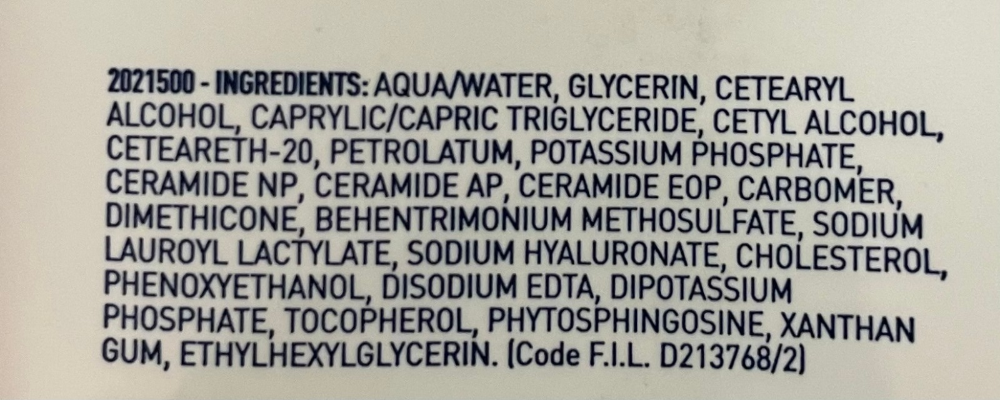

Bilateral filtered image:


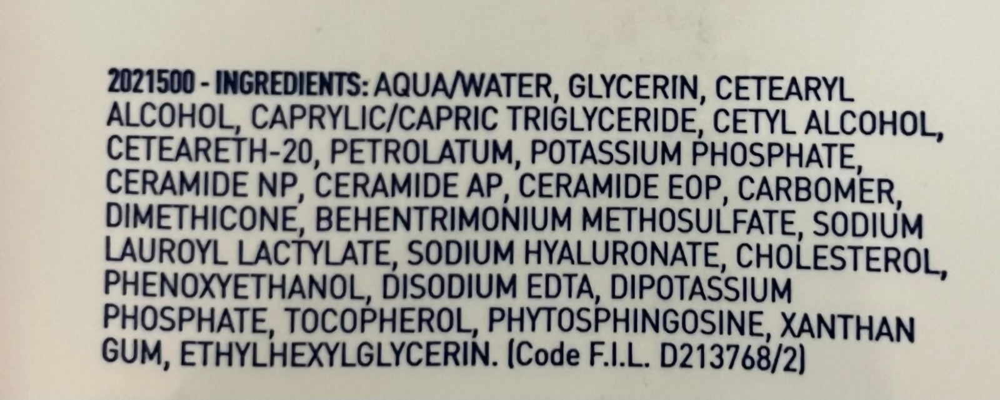

Contrast enhanced image:


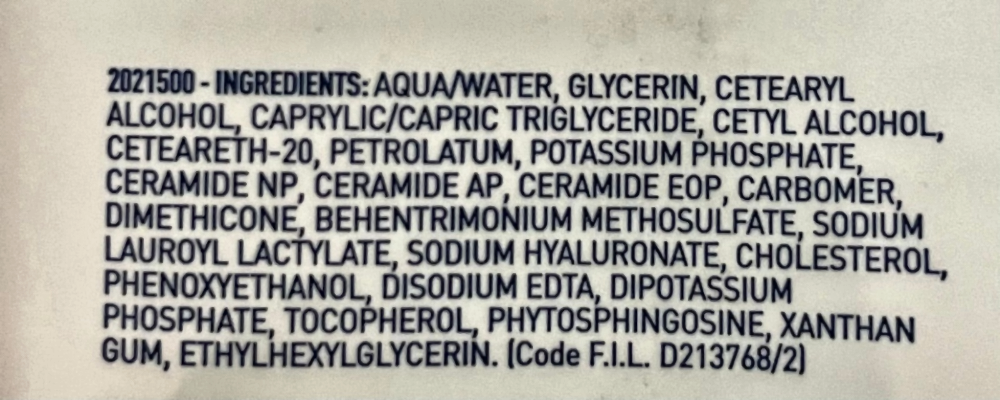

OCR text: 2021500 - INGREDIENTS: AQUAWATER, GLYCERIN, CETEARYL ALCOHOL_CAPRYLICICAPRIC TRIGLYCERIDE' CETYL ALCOHOL, CETEARETH-20, 1 PETROLATUM, 1 POTASSIUM PHOSPHATE, CERAMIDE NP, CERAMIDE AP,CERAMIDE EOP, CARBOMER, DIMETHICONE,BEHENTRIMONIUM METHOSULFATE, SODIUM BAUROYL LACTYLATE SODIUMHYALURONATE CHOLESTEROL, PHENOXYETHANOL, DISODIUM EDTA,DIPOTASSIUM PHOSPHATE; TOCOPHEROL PHYTOSPHINGOSINE, XANTHAN GUM, ETHYLHEXYLGLYCERIN: (Code FIL. 0213768/2)


In [ ]:
processed = preprocess_image_for_ocr_lighter(img_filename, debug=True)

# Convert from OpenCV's BGR to RGB (EasyOCR expects RGB if you pass a NumPy array)
processed_rgb = cv2.cvtColor(processed, cv2.COLOR_BGR2RGB)

reader = easyocr.Reader(['en'], gpu=False)
# If passing a NumPy array: use readtext directly on 'processed_rgb'
ocr_results = reader.readtext(processed_rgb, detail=1)
# Or if you prefer, you can skip the color conversion by just giving EasyOCR the path
# but if you're passing an array, it's typically in RGB.

recognized_texts = [res[1] for res in ocr_results]
all_text = " ".join(recognized_texts)
print("OCR text:", all_text)


Original Image


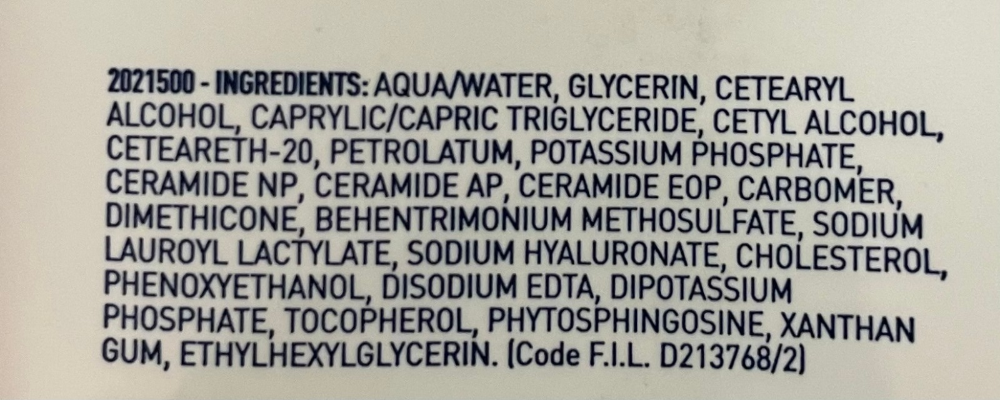

Shape: (641, 1600, 3) 

Rotation disabled; skipping deskew rotation.
Grayscale


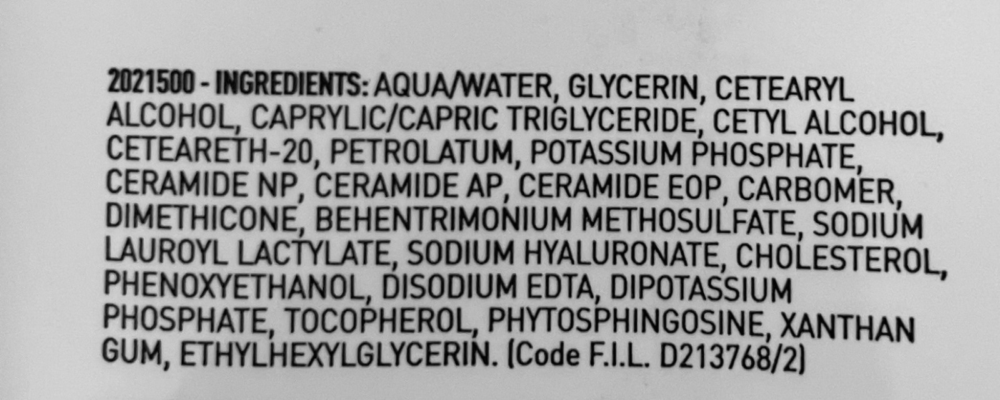

Shape: (641, 1600) 

Background Subtracted (Norm)


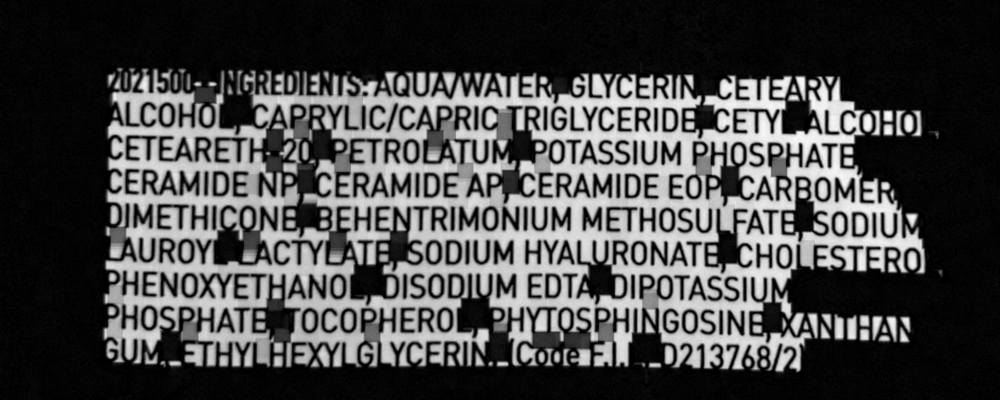

Shape: (641, 1600) 

Otsu Threshold Output


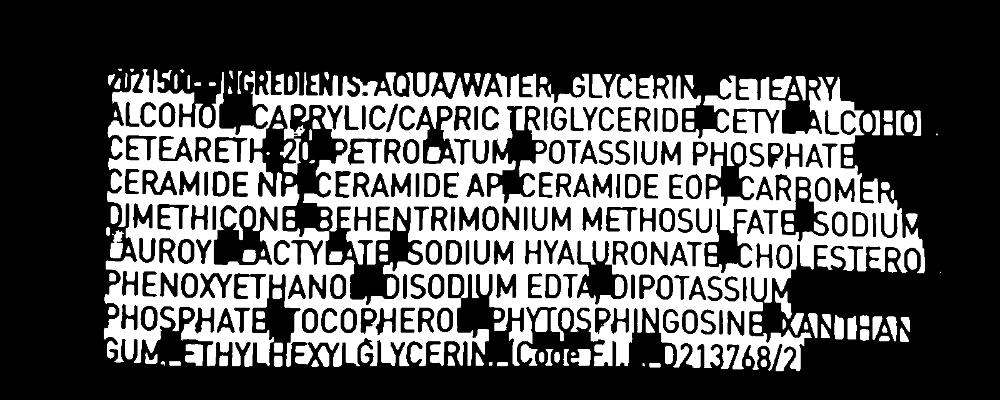

Shape: (641, 1600) 

Morph Closed


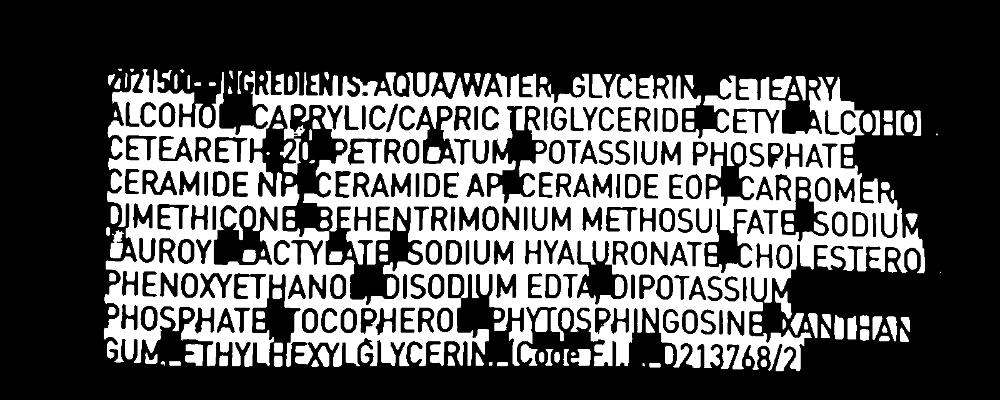

Shape: (641, 1600) 


All OCR text:
 accotoC RYLiCICYRRCHRI ~GLYCIERIN_ CE TEAIRY CAPRYLICICAPRIC TRIGLYCERIDE CETY  ALCOHH[O] CETEARETH PETROLATUM, POTASSIUM PHOSPHATE CERAMIDE NF_CERAMIDE APECERAMIDE EOF CARBOMER YUMETHICONE BEHENTRIMONIUM METHOSUL' FATE SoDiU ZUROY _ACTYLHTEL SODIUM HYALURONATE CHO FESTERO] PHENOXYETHANO  DISODIVM EDTA DIPOTASSIUM PHOSPHATE TOCOPHERO PHyosphinGose XAINJIHIAI Gul_THYIHISXYIGLYCFRIN _02137168921


In [ ]:
# A) Preprocess the uploaded image
#processed = preprocess_image_for_ocr(img_filename, debug=True)

# B) Perform OCR
#reader = easyocr.Reader(['en'], gpu=True)
#ocr_results = reader.readtext(processed, detail=1)

# Merge recognized text from bounding boxes
#recognized_texts = [res[1] for res in ocr_results]
#all_text = " ".join(recognized_texts)
#print("\n==========\nAll OCR text:\n", all_text)

In [ ]:
final_ingredient_list = extract_ingredients_v2(
    all_text,
    known_ingredients=ingredients_list,
    debug=True
)

print("\n=== Final Ingredients ===")
for ingr in final_ingredient_list:
    print("-", ingr)

OCR token: 'aquawater' => matched: 'Aqua/water'
OCR token: 'glycerin' => matched: 'glycerin'
OCR token: 'cetearyl alcoholcaprylicicapric triglyceride cetyl alcohol' => matched: 'cetearyl alcoholcaprylicicapric triglyceride cetyl alcohol'
OCR token: 'ceteareth-20' => matched: 'ceteareth-20'
OCR token: '1 petrolatum' => matched: 'Petrolatum'
OCR token: '1 potassium phosphate' => matched: 'Dipotassium Phosphate'
OCR token: 'ceramide np' => matched: 'Ceramide Np'
OCR token: 'ceramide ap' => matched: 'Ceramide Np'
OCR token: 'ceramide eop' => matched: 'Ceramide Eop'
OCR token: 'carbomer' => matched: 'carbomer'
OCR token: 'dimethicone' => matched: 'dimethicone'
OCR token: 'behentrimonium methosulfate' => matched: 'Behentrimonium Methosulfate'
OCR token: 'sodium bauroyl lactylate sodiumhyaluronate cholesterol' => matched: 'sodium bauroyl lactylate sodiumhyaluronate cholesterol'
OCR token: 'phenoxyethanol' => matched: 'phenoxyethanol'
OCR token: 'disodium edta' => matched: 'disodium edta'
OCR 

In [ ]:
"""
final_ingredient_list = extract_ingredients(all_text, known_ingredients=my_known_ingredients)

print("\n=== Final Ingredients ===")
for ingr in final_ingredient_list:
    print("-", ingr)
"""

'\nfinal_ingredient_list = extract_ingredients(all_text, known_ingredients=my_known_ingredients)\n\nprint("\n=== Final Ingredients ===")\nfor ingr in final_ingredient_list:\n    print("-", ingr)\n'

## GPT-4o Explanations

In [ ]:
!pip install openai

In [ ]:
from openai import OpenAI

In [ ]:
client = OpenAI(api_key="")

In [ ]:
final_ingredient_string = ", ".join(final_ingredient_list)

In [ ]:
prompt = """You are given a list of ingredients for a product. For each ingredient, do the following: 1. Provide a short description of the ingredient (what it is, its purpose or benefits). 2. Check if the ingredient has any potential safety concerns or health risks. If it does, provide a warning. If the ingredient is safe, mention that it is safe for general use.\n\nThe output should be in JSON format with the following structure: - \"ingredients\": A list of descriptions for each ingredient. - \"safety\": A list of safety warnings for potentially harmful ingredients. - \"summary\": A brief summary of the product, including any important safety information.\n\n### For example ingredient List:\nSodium Lauryl Sulfate, Glycerin, Vitamin C, Parabens\n\nResponse Format:\n{\n  \"ingredients\": [\n    { \"Sodium Lauryl Sulfate\": \"A surfactant commonly used in cleansing products for its ability to create foam. It helps in removing dirt and oil from the skin.\" },\n    { \"Glycerin\": \"A humectant that draws moisture into the skin, helping to keep it hydrated. It is commonly used in skincare products.\" },\n    { \"Vitamin C\": \"An antioxidant that brightens the skin and helps to reduce the appearance of fine lines and wrinkles.\" },\n    { \"Parabens\": \"A group of preservatives used in cosmetics to prevent microbial growth and extend shelf life.\" }\n  ],\n  \"safety\": [\n    { \"Sodium Lauryl Sulfate\": \"May cause irritation for sensitive skin types. If irritation occurs, discontinue use.\" },\n    { \"Parabens\": \"Some studies suggest that parabens may disrupt hormone function, but more research is needed to understand the full risks.\" }\n  ],\n  \"summary\": \"This product contains ingredients that are generally safe for most users. However, individuals with sensitive skin should be cautious of Sodium Lauryl Sulfate, and those concerned about hormone disruption may want to avoid products with parabens.\"\n}. \n The ingredient list is :""" + final_ingredient_string

In [ ]:
completion = client.chat.completions.create(
  model="gpt-4o-mini",
  messages=[
    {"role": "system", "content": "You are a knowledgeable assistant that helps analyze and provide information about cosmetic and skincare ingredients. You will describe each ingredient, check for potential safety concerns, and summarize the overall product."},
    {"role": "user", "content": prompt}
  ]
)


print(completion.choices[0].message.content)

```json
{
  "ingredients": [
    { "Aqua/Water": "The most common solvent used in cosmetics, serving as a base for formulations. It helps to dissolve other ingredients." },
    { "Glycerin": "A humectant that draws moisture into the skin, helping to keep it hydrated. It is commonly used in skincare products." },
    { "Cetearyl Alcohol": "A fatty alcohol used as an emollient and emulsifier, which helps to soften and smooth the skin." },
    { "Caprylic/Capric Triglyceride": "A mixed triglyceride derived from coconut oil and glycerin, used as an emollient and to help stabilize emulsions." },
    { "Cetyl Alcohol": "Another fatty alcohol that acts as an emollient and thickening agent, providing a smooth texture to the product." },
    { "Ceteareth-20": "A non-ionic emulsifier that helps blend oil and water in formulations, stabilizing creams and lotions." },
    { "Petrolatum": "A mineral oil derivative that creates a barrier on the skin, helping to lock in moisture and protect the skin.

In [ ]:
"""
# 6. Locate "Ingredients"
lower_text = all_text.lower()
idx = lower_text.find("ingredients")

if idx != -1:
    # We found the word 'ingredients'
    # Let’s now capture the text after 'ingredients'
    start_idx = idx + len("ingredients")  # start right after the word "ingredients"

    # OPTIONAL: If your text often includes a colon (":") after "ingredients",
    # you could skip that too:
    # e.g. if "Ingredients: Water, Glycerin..." => skip the colon
    # Let's do a small check:
    if start_idx < len(all_text) and all_text[start_idx] in [":", ":", " "]:
        # skip colon or space
        start_idx += 1

    # 2. Now find the next period AFTER this index
    substring_from_ingredients = all_text[start_idx:]
    period_pos = substring_from_ingredients.find(".")

    if period_pos != -1:
        # There's a period somewhere after 'ingredients'
        # So let's take everything up to that period
        ingredient_section = substring_from_ingredients[:period_pos]
    else:
        # If no period found, we just take everything
        ingredient_section = substring_from_ingredients

    # For clarity, let's print what we got
    print("\nIngredient Section Found (before splitting):\n", ingredient_section)

    # 3. Now we can do a comma-split or semicolon-split
    #    or any other delimiters you expect
    #    Example: split by commas
    raw_ingredients = [x.strip() for x in ingredient_section.split(',') if x.strip()]

    print("\nRaw ingredient items (split by comma):\n", raw_ingredients)

    # 4. Suppose we have a set of known ingredients for fuzzy-correction
    known_ingredients = [
        "water", "glycerin", "mineral oil", "paraffinum liquidum",
        "fragrance", "parfum", "niacinamide", "hyaluronic acid",
        "cetyl alcohol", "glyceryl stearate"
        # ... add as needed
    ]

    cleaned_ingredients = []
    for ingr in raw_ingredients:
        # Remove parentheses content
        ingr_no_paren = re.sub(r"\(.*?\)", "", ingr).strip()
        # Remove non alphanumeric / slash / dash etc.
        ingr_clean = re.sub(r"[^a-zA-Z0-9\s\-/]", "", ingr_no_paren).strip().lower()
        # Attempt fuzzy correction
        ingr_corrected = fuzzy_correct(ingr_clean, known_ingredients, cutoff=0.75)
        cleaned_ingredients.append(ingr_corrected)

    print("\nCleaned Ingredient List:")
    for c in cleaned_ingredients:
        print("-", c)
else:
    print("No 'Ingredients' keyword found in the recognized text.")


"""


Ingredient Section Found (before splitting):
  Water (Aqua, Eau); Mineral Oil (ar: affinum Liquidum , Huile minerale) Glycerin, Fra- grance (Parfum) , Cetyl Alcohol; Glyceryl Stearate, PEG 100 Stearate, Palmitic Acid; Stearic Acid, Di methicone Methylparaben, Diazolidinyl Urea lates/C1O 30 Alkyl Acrylate Crosspolymer Sodiumi Hydroxide Propylparaben BHT, Disodium EDTA To copheryl Acetate, Aloe Barbadensis Leaf

Raw ingredient items (split by comma):
 ['Water (Aqua', 'Eau); Mineral Oil (ar: affinum Liquidum', 'Huile minerale) Glycerin', 'Fra- grance (Parfum)', 'Cetyl Alcohol; Glyceryl Stearate', 'PEG 100 Stearate', 'Palmitic Acid; Stearic Acid', 'Di methicone Methylparaben', 'Diazolidinyl Urea lates/C1O 30 Alkyl Acrylate Crosspolymer Sodiumi Hydroxide Propylparaben BHT', 'Disodium EDTA To copheryl Acetate', 'Aloe Barbadensis Leaf']

Cleaned Ingredient List:
- water aqua
- eau mineral oil ar affinum liquidum
- huile minerale glycerin
- fragrance
- cetyl alcohol glyceryl stearate
- peg 10



```
# This is formatted as code
```

##Skin Type Classification - old

In [ ]:
import os
import copy
import numpy as np
import pandas as pd
from PIL import Image

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler
import torchvision.transforms as T
import torchvision.models as models

from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, f1_score

import matplotlib.pyplot as plt
from google.colab import files

In [ ]:
uploaded = files.upload()
zip_filename = next(iter(uploaded.keys()))
print(f"Uploaded file: {zip_filename}")
!unzip -q "{zip_filename}" -d /content/dataset

print("Contents of /content/dataset:")
!ls /content/dataset

Saving archive (6).zip to archive (6) (1).zip
Uploaded file: archive (6) (1).zip
replace /content/dataset/Oily-Dry-Skin-Types/README.dataset.txt? [y]es, [n]o, [A]ll, [N]one, [r]ename: y
replace /content/dataset/Oily-Dry-Skin-Types/test/dry/dry_10583924a54a7cbcf5d0_jpg.rf.7c4cb0ac9522f3a0faaf230527e1abe9.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: y
replace /content/dataset/Oily-Dry-Skin-Types/test/dry/dry_1d3b1b41c06745c89fb6_jpg.rf.9fe7b2181a36c2b6f67744be1af2fdd7.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: y
replace /content/dataset/Oily-Dry-Skin-Types/test/dry/dry_2e2591d4cf31b8e024a6_jpg.rf.e8a8db4db95cd0a0df0275d75fcd87a0.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: y
replace /content/dataset/Oily-Dry-Skin-Types/test/dry/dry_304ff9ea442145481f67_jpg.rf.26e1ca5ca2eb32f5c89509c670ca967a.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: y
replace /content/dataset/Oily-Dry-Skin-Types/test/dry/dry_33489ccedfbd77039b4d_jpg.rf.bff22d94ad08b5402f1feb8e304a7368.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ena

In [ ]:
LABEL_TO_IDX = {"dry": 0, "normal": 1, "oily": 2}
IDX_TO_LABEL = {v: k for k, v in LABEL_TO_IDX.items()}


In [ ]:
def build_dataframe(base_dir):
    """
    Creates a DataFrame with columns: [image_path, label_idx].
    Expects subfolders in base_dir named 'dry', 'normal', 'oily'.
    """
    filepaths = []
    labels = []
    for label_name in os.listdir(base_dir):
        subfolder = os.path.join(base_dir, label_name)
        if not os.path.isdir(subfolder):
            continue
        for fname in os.listdir(subfolder):
            if fname.lower().endswith(('.jpg', '.png', '.jpeg')):
                fpath = os.path.join(subfolder, fname)
                filepaths.append(fpath)
                labels.append(LABEL_TO_IDX[label_name])
    return pd.DataFrame({"image_path": filepaths, "label_idx": labels})


In [ ]:
# Adjust these paths according to your dataset folder structure
train_path = "/content/dataset/Oily-Dry-Skin-Types/train"
val_path   = "/content/dataset/Oily-Dry-Skin-Types/valid"
test_path  = "/content/dataset/Oily-Dry-Skin-Types/test"

train_df = build_dataframe(train_path)
val_df   = build_dataframe(val_path)
test_df  = build_dataframe(test_path)

print("Train shape:", train_df.shape)
print("Val shape:",   val_df.shape)
print("Test shape:",  test_df.shape)
#print(train_df[train_df['label_idx']==1])

Train shape: (2756, 2)
Val shape: (262, 2)
Test shape: (134, 2)


In [ ]:
class SkinTypeDataset(Dataset):
    def __init__(self, dataframe, transform=None):
        super().__init__()
        self.dataframe = dataframe.reset_index(drop=True)
        self.transform = transform

    def __len__(self):
        return len(self.dataframe)

    def __getitem__(self, idx):
        row = self.dataframe.iloc[idx]
        img_path = row['image_path']
        label = row['label_idx']

        # Read image
        image = Image.open(img_path).convert("RGB")
        #image = np.array(image)

        if self.transform:
            image = self.transform(image)

        return image, label


In [ ]:
IMG_SIZE = 224
'''
train_transform = T.Compose([
    T.Resize((IMG_SIZE, IMG_SIZE)),
    T.RandomHorizontalFlip(p=0.5),
    T.RandomVerticalFlip(p=0.3),
    T.RandomRotation(15),
    T.ColorJitter(brightness=0.2, contrast=0.2),
    T.ToTensor(),
    T.Normalize(mean=[0.485, 0.456, 0.406],
                std=[0.229, 0.224, 0.225])
])
'''
train_transform = T.Compose([
    # RandomResizedCrop can help model see different scales
    T.RandomResizedCrop(IMG_SIZE, scale=(0.8, 1.0)),
    T.RandomHorizontalFlip(p=0.5),
    T.RandomVerticalFlip(p=0.3),
    T.RandomRotation(15),
    T.ColorJitter(brightness=0.2, contrast=0.2),
    T.ToTensor(),
    T.RandomErasing(p=0.3),  # randomly erase a patch
    T.Normalize(mean=[0.485, 0.456, 0.406],
                std=[0.229, 0.224, 0.225])
])

val_transform = T.Compose([
    T.Resize((IMG_SIZE, IMG_SIZE)),
    T.ToTensor(),
    T.Normalize(mean=[0.485, 0.456, 0.406],
                std=[0.229, 0.224, 0.225])
])

train_dataset = SkinTypeDataset(train_df, transform=train_transform)
val_dataset   = SkinTypeDataset(val_df,   transform=val_transform)
test_dataset  = SkinTypeDataset(test_df,  transform=val_transform)



In [ ]:
train_class_counts = train_df['label_idx'].value_counts().sort_index()
print("Train class distribution:\n", train_class_counts)

# weight for each sample = 1 / count_of_that_class
weights = [1.0 / train_class_counts[label] for label in train_df['label_idx']]
sampler = WeightedRandomSampler(weights,
                                num_samples=len(weights),
                                replacement=True)


Train class distribution:
 label_idx
0     652
1    1104
2    1000
Name: count, dtype: int64


In [ ]:
BATCH_SIZE = 32

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE,
                          sampler=sampler,  # remove shuffle=True if sampler is used
                          num_workers=2)

val_loader   = DataLoader(val_dataset,   batch_size=BATCH_SIZE, shuffle=False, num_workers=2)
test_loader  = DataLoader(test_dataset,  batch_size=BATCH_SIZE, shuffle=False, num_workers=2)


In [ ]:
device = "cuda" if torch.cuda.is_available() else "cpu"


In [ ]:
model_base = models.efficientnet_v2_s(weights=models.EfficientNet_V2_S_Weights.IMAGENET1K_V1)


In [ ]:
num_features = model_base.classifier[1].in_features
model_base.classifier = nn.Sequential(
    nn.Dropout(p=0.5),
    nn.Linear(num_features, 256),
    nn.ReLU(inplace=True),
    nn.Dropout(p=0.3),
    nn.Linear(256, 128),      # extra hidden layer
    nn.ReLU(inplace=True),
    nn.Dropout(p=0.3),
    nn.Linear(128, 3)
)


model_base.to(device)



EfficientNet(
  (features): Sequential(
    (0): Conv2dNormActivation(
      (0): Conv2d(3, 24, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(24, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
      (2): SiLU(inplace=True)
    )
    (1): Sequential(
      (0): FusedMBConv(
        (block): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(24, 24, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
            (1): BatchNorm2d(24, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
            (2): SiLU(inplace=True)
          )
        )
        (stochastic_depth): StochasticDepth(p=0.0, mode=row)
      )
      (1): FusedMBConv(
        (block): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(24, 24, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
            (1): BatchNorm2d(24, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  

In [ ]:
#reduce lr on plateau
#try on test
EPOCHS = 1000
LR = 1e-3
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model_base.parameters(), lr=LR)

# Optional scheduler
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)

# Early stopping
patience = 20
best_val_loss = float('inf')
early_stop_counter = 0


NameError: name 'nn' is not defined

In [ ]:
best_model_wts = copy.deepcopy(model_base.state_dict())
best_val_acc = 0.0

train_loss_history = []
train_acc_history = []
val_loss_history   = []
val_acc_history    = []

for epoch in range(EPOCHS):
    # ---------------------
    # 6.1 Training Phase
    # ---------------------
    model_base.train()
    running_loss = 0.0
    running_corrects = 0
    total_samples = 0

    for images, labels in train_loader:
        images, labels = images.to(device), labels.to(device)
        optimizer.zero_grad()

        outputs = model_base(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        _, preds = torch.max(outputs, 1)
        running_loss += loss.item() * images.size(0)
        running_corrects += torch.sum(preds == labels).item()
        total_samples += images.size(0)

    epoch_train_loss = running_loss / total_samples
    epoch_train_acc  = running_corrects / total_samples
    train_loss_history.append(epoch_train_loss)
    train_acc_history.append(epoch_train_acc)

    # ---------------------
    # 6.2 Validation Phase
    # ---------------------
    model_base.eval()
    val_loss = 0.0
    val_corrects = 0
    val_samples = 0

    with torch.no_grad():
        for images, labels in val_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model_base(images)
            loss = criterion(outputs, labels)

            _, preds = torch.max(outputs, 1)
            val_loss += loss.item() * images.size(0)
            val_corrects += torch.sum(preds == labels).item()
            val_samples += images.size(0)

    epoch_val_loss = val_loss / val_samples
    epoch_val_acc  = val_corrects / val_samples
    val_loss_history.append(epoch_val_loss)
    val_acc_history.append(epoch_val_acc)

    scheduler.step()

    print(f"Epoch {epoch+1}/{EPOCHS} | "
          f"Train Loss: {epoch_train_loss:.4f} Acc: {epoch_train_acc:.4f} | "
          f"Val Loss: {epoch_val_loss:.4f} Acc: {epoch_val_acc:.4f}")

    # Early stopping check
    if epoch_val_loss < best_val_loss:
        best_val_loss = epoch_val_loss
        best_val_acc = epoch_val_acc
        best_model_wts = copy.deepcopy(model_base.state_dict())
        early_stop_counter = 0
    else:
        early_stop_counter += 1

    if early_stop_counter >= patience:
        print(f"Early stopping triggered at epoch {epoch+1}")
        break

Epoch 1/1000 | Train Loss: 1.0933 Acc: 0.3708 | Val Loss: 1.2388 Acc: 0.2824
Epoch 2/1000 | Train Loss: 1.0848 Acc: 0.4046 | Val Loss: 1.1240 Acc: 0.3053
Epoch 3/1000 | Train Loss: 1.0891 Acc: 0.4067 | Val Loss: 1.1377 Acc: 0.3321
Epoch 4/1000 | Train Loss: 1.0941 Acc: 0.3730 | Val Loss: 1.1236 Acc: 0.3855
Epoch 5/1000 | Train Loss: 1.0832 Acc: 0.3944 | Val Loss: 1.1177 Acc: 0.3206
Epoch 6/1000 | Train Loss: 1.0803 Acc: 0.4002 | Val Loss: 1.1079 Acc: 0.3435
Epoch 7/1000 | Train Loss: 1.0652 Acc: 0.4126 | Val Loss: 1.3007 Acc: 0.3282
Epoch 8/1000 | Train Loss: 1.0617 Acc: 0.4311 | Val Loss: 1.0922 Acc: 0.3702
Epoch 9/1000 | Train Loss: 1.0283 Acc: 0.4659 | Val Loss: 1.1097 Acc: 0.3702
Epoch 10/1000 | Train Loss: 1.0105 Acc: 0.4902 | Val Loss: 1.1368 Acc: 0.3321
Epoch 11/1000 | Train Loss: 0.9994 Acc: 0.4931 | Val Loss: 1.1608 Acc: 0.3244
Epoch 12/1000 | Train Loss: 0.9838 Acc: 0.5221 | Val Loss: 1.1730 Acc: 0.3626
Epoch 13/1000 | Train Loss: 0.9484 Acc: 0.5515 | Val Loss: 1.2105 Acc: 0.

In [ ]:
# Load best weights
model_base.load_state_dict(best_model_wts)
print(f"Best val loss = {best_val_loss:.4f}, Best val acc = {best_val_acc:.4f}")


Best val loss = 1.0922, Best val acc = 0.3702


In [ ]:
model_base.eval()
all_preds = []
all_truth = []

with torch.no_grad():
    for images, labels in test_loader:
        images, labels = images.to(device), labels.to(device)
        outputs = model_base(images)
        _, preds = torch.max(outputs, 1)
        all_preds.extend(preds.cpu().numpy())
        all_truth.extend(labels.cpu().numpy())

acc = accuracy_score(all_truth, all_preds)
macro_f1 = f1_score(all_truth, all_preds, average='macro')
print("Test Accuracy:", acc)
print("Macro-average F1:", macro_f1)
print("Detailed Classification Report:")
print(classification_report(all_truth, all_preds, target_names=list(LABEL_TO_IDX.keys())))


Test Accuracy: 0.4253731343283582
Macro-average F1: 0.41188846098987303
Detailed Classification Report:
              precision    recall  f1-score   support

         dry       0.26      0.34      0.29        35
      normal       0.55      0.51      0.53        59
        oily       0.47      0.38      0.42        40

    accuracy                           0.43       134
   macro avg       0.42      0.41      0.41       134
weighted avg       0.45      0.43      0.43       134



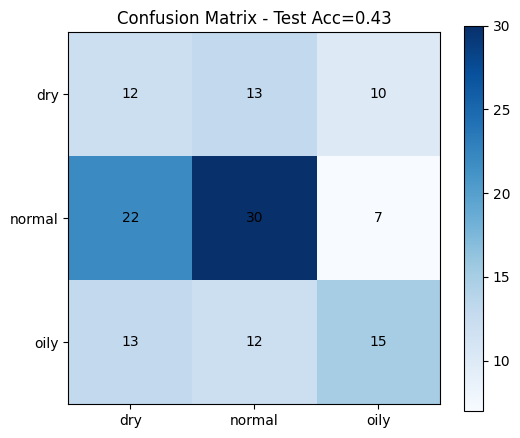

In [ ]:
cm = confusion_matrix(all_truth, all_preds)
plt.figure(figsize=(6,5))
plt.imshow(cm, cmap='Blues')
plt.title(f"Confusion Matrix - Test Acc={acc:.2f}")
plt.colorbar()
plt.xticks(ticks=[0,1,2], labels=LABEL_TO_IDX.keys())
plt.yticks(ticks=[0,1,2], labels=LABEL_TO_IDX.keys())

for i in range(3):
    for j in range(3):
        plt.text(j, i, cm[i, j], ha='center', va='center', color='black')

plt.show()

In [ ]:
def predict_skin_type(image_path, model, transform=val_transform):
    model.eval()
    img = Image.open(image_path).convert('RGB')
    x = transform(img).unsqueeze(0).to(device)
    with torch.no_grad():
        output = model(x)
        _, pred = torch.max(output, 1)
    return IDX_TO_LABEL[pred.item()]

In [ ]:
# Example usage:
predicted_type = predict_skin_type("oily.jpg", model_base)
print("Predicted skin type:", predicted_type)

Predicted skin type: oily


In [ ]:
import torch

# Suppose model_base is your trained PyTorch model
model_base.eval()

# Save entire model with state_dict
torch.save(model_base.state_dict(), "skin_type_model.pth")
print("Model saved as skin_type_model.pth")


Model saved as skin_type_model.pth


#Skin Type Analysis v2


In [ ]:
import numpy as np
import pandas as pd
import os
from copy import deepcopy
from PIL import Image
from torchvision import transforms
from torchvision.models import resnet50, ResNet50_Weights
from sklearn.model_selection import train_test_split
from torch.utils.data import Dataset, DataLoader
import torch
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from google.colab import files


In [ ]:
def create_df(base):
    dd = {"images": [], "labels": []}
    for i in os.listdir(base):
        if i in label_index:
            label = os.path.join(base, i)
            for j in os.listdir(label):
                img = os.path.join(label, j)
                dd["images"].append(img)
                dd["labels"].append(label_index[i])
    return pd.DataFrame(dd)


In [ ]:
uploaded = files.upload()
zip_filename = next(iter(uploaded.keys()))
print(f"Uploaded file: {zip_filename}")
!unzip -q "{zip_filename}" -d /content/dataset

print("Contents of /content/dataset:")
!ls /content/dataset

Saving archive (6).zip to archive (6).zip
Uploaded file: archive (6).zip
Contents of /content/dataset:
Oily-Dry-Skin-Types


In [ ]:
LABEL_TO_IDX = {"dry": 0, "normal": 1, "oily": 2}
IDX_TO_LABEL = {v: k for k, v in LABEL_TO_IDX.items()}



In [ ]:
def build_dataframe(base_dir):
    """
    Creates a DataFrame with columns: [image_path, label_idx].
    Expects subfolders in base_dir named 'dry', 'normal', 'oily'.
    """
    filepaths = []
    labels = []
    for label_name in os.listdir(base_dir):
        subfolder = os.path.join(base_dir, label_name)
        if not os.path.isdir(subfolder):
            continue
        for fname in os.listdir(subfolder):
            if fname.lower().endswith(('.jpg', '.png', '.jpeg')):
                fpath = os.path.join(subfolder, fname)
                filepaths.append(fpath)
                labels.append(LABEL_TO_IDX[label_name])
    return pd.DataFrame({"image_path": filepaths, "label_idx": labels})


In [ ]:
# Adjust these paths according to your dataset folder structure
train_path = "/content/dataset/Oily-Dry-Skin-Types/train"
val_path   = "/content/dataset/Oily-Dry-Skin-Types/valid"
test_path  = "/content/dataset/Oily-Dry-Skin-Types/test"

train_df = build_dataframe(train_path)
val_df   = build_dataframe(val_path)
test_df  = build_dataframe(test_path)

print("Train shape:", train_df.shape)
print("Val shape:",   val_df.shape)
print("Test shape:",  test_df.shape)
#print(train_df[train_df['label_idx']==1])

Train shape: (2756, 2)
Val shape: (262, 2)
Test shape: (134, 2)


In [ ]:
#train_df = create_df("/kaggle/input/oily-dry-and-normal-skin-types-dataset/Oily-Dry-Skin-Types/train")
#val_df = create_df("/kaggle/input/oily-dry-and-normal-skin-types-dataset/Oily-Dry-Skin-Types/valid")
#test_df = create_df("/kaggle/input/oily-dry-and-normal-skin-types-dataset/Oily-Dry-Skin-Types/test")

# Combine all data, then split into train/validation/test sets
train_df, testing = train_test_split(train_df, random_state=42, test_size=0.2)
val_df, test_df = train_test_split(testing, random_state=42, test_size=0.5)

In [ ]:
import torch
from torchvision import transforms
from torchvision.models import resnet50
from sklearn.metrics import classification_report, confusion_matrix

# Define transforms (same as during validation)
val_transforms = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

# Rebuild dataset and DataLoader
val_df = build_dataframe('/content/dataset/Oily-Dry-Skin-Types/valid')
val_dataset = CloudDS(val_df, transform=val_transforms)
val_dl = DataLoader(val_dataset, batch_size=32, shuffle=False)

# Reload model
model = resnet50(weights=None)
model.fc = nn.Sequential(
    nn.Dropout(0.4),
    nn.Linear(model.fc.in_features, 3)
)
model.load_state_dict(torch.load('/content/your_model.pth'))  # Adjust path
model.to(device)
model.eval()

# Run inference
true_labels = []
predicted_labels = []

with torch.no_grad():
    for data, target in val_dl:
        data, target = data.to(device), target.to(device)
        output = model(data)
        preds = output.argmax(1)

        true_labels.extend(target.cpu().numpy())
        predicted_labels.extend(preds.cpu().numpy())

# Generate classification report
from sklearn.metrics import classification_report
print(classification_report(true_labels, predicted_labels, target_names=["dry", "normal", "oily"]))


In [ ]:
class CloudDS(Dataset):
    def __init__(self, data, transform):
        self.data = data
        self.transform = transform

    def __len__(self):
        return len(self.data)

    def __getitem__(self, x):
        img_path, label = self.data.iloc[x, 0], self.data.iloc[x, 1]
        img = Image.open(img_path).convert("RGB")
        img = self.transform(img)

        return img, label

In [ ]:
train_transforms = transforms.Compose([
    transforms.RandomResizedCrop(224),
    transforms.RandomRotation(30),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

val_test_transforms = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

In [ ]:
# Datasets & Loaders
train_dataset = CloudDS(train_df, transform=train_transforms)
val_dataset = CloudDS(val_df, transform=val_test_transforms)

train_dl = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_dl = DataLoader(val_dataset, batch_size=32, shuffle=False)

# Load pre-trained ResNet50
resnet = resnet50(weights=ResNet50_Weights.DEFAULT)

# Partial fine-tuning: only 'layer4' and 'fc'
#for name, param in resnet.named_parameters():
 #   param.requires_grad = True if 'layer4' in name or 'fc' in name else False

# Unfreeze 'layer3' and 'layer4' for fine-tuning

for name, param in resnet.named_parameters():
    if 'layer3' in name or 'layer4' in name or 'fc' in name:
        param.requires_grad = True
    else:
        param.requires_grad = False


In [ ]:
# Add Dropout + final layer

resnet.fc = nn.Sequential(
    nn.Dropout(0.4),
    nn.Linear(resnet.fc.in_features, len(LABEL_TO_IDX))
)

# Move to GPU if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = deepcopy(resnet).to(device)

# Loss, Optimizer, Scheduler
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model.parameters(), lr=0.001, momentum=0.9)
#scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=10, gamma=0.1)

scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'max', patience=3, factor=0.5, verbose=True)


/usr/local/lib/python3.11/dist-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


In [ ]:
# Load pre-trained ResNet50 and adjust the final layer for 2 classes
resnet = resnet50(weights=ResNet50_Weights.DEFAULT)
resnet.fc = nn.Linear(resnet.fc.in_features, len(LABEL_TO_IDX))

# Check if CUDA is available and move the model to GPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = deepcopy(resnet).to(device)

# Define loss, optimizer, and learning rate scheduler
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model.parameters(), lr=0.01)
scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=15, gamma=0.1)

In [ ]:
import torch
from copy import deepcopy
import os

In [ ]:
os.environ['CUDA_LAUNCH_BLOCKING'] = '1'

In [ ]:
# Training loop with early stopping
train_loss = []
train_acc = []
val_loss = []
val_acc = []

best_acc = 0
best_model_state_dict = deepcopy(model.state_dict())
patience = 20
trigger_times = 0

for epoch in range(1, 1000):
    model.train()
    running_loss = 0
    correct = 0
    total = 0

    for data, target in train_dl:
        data, target = data.to(device), target.to(device)
        optimizer.zero_grad()
        out = model(data)
        loss = criterion(out, target)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()
        correct += (out.argmax(1) == target).sum().item()
        total += target.size(0)

    train_loss.append(running_loss / total)
    train_acc.append(correct / total)

    # Validation
    model.eval()
    val_running_loss = 0
    val_correct = 0
    val_total = 0

    with torch.no_grad():
        for data, target in val_dl:
            data, target = data.to(device), target.to(device)
            out = model(data)
            loss = criterion(out, target)
            val_running_loss += loss.item()
            val_correct += (out.argmax(1) == target).sum().item()
            val_total += target.size(0)

    val_loss.append(val_running_loss / val_total)
    val_acc.append(val_correct / val_total)

    # Early stopping


    if val_acc[-1] > best_acc:
        best_acc = val_acc[-1]
        best_model_state_dict = deepcopy(model.state_dict())
        trigger_times = 0
    else:
        trigger_times += 1
        if trigger_times >= patience:
            print(f"Early stopping at epoch {epoch}")
            break

    #scheduler.step()
    scheduler.step(val_acc[-1])

    print(f"Epoch {epoch}, Train Loss: {train_loss[-1]:.4f}, Acc: {train_acc[-1]:.4f}, Val Loss: {val_loss[-1]:.4f}, Acc: {val_acc[-1]:.4f}")


Epoch 1, Train Loss: 0.0328, Acc: 0.4406, Val Loss: 0.0347, Acc: 0.4565
Epoch 2, Train Loss: 0.0325, Acc: 0.4496, Val Loss: 0.0346, Acc: 0.4710
Epoch 3, Train Loss: 0.0320, Acc: 0.4642, Val Loss: 0.0341, Acc: 0.4529
Epoch 4, Train Loss: 0.0314, Acc: 0.4877, Val Loss: 0.0344, Acc: 0.4746
Epoch 5, Train Loss: 0.0308, Acc: 0.5095, Val Loss: 0.0338, Acc: 0.4746
Epoch 6, Train Loss: 0.0305, Acc: 0.5240, Val Loss: 0.0331, Acc: 0.5145
Epoch 7, Train Loss: 0.0299, Acc: 0.5554, Val Loss: 0.0333, Acc: 0.4964
Epoch 8, Train Loss: 0.0294, Acc: 0.5540, Val Loss: 0.0326, Acc: 0.5362
Epoch 9, Train Loss: 0.0288, Acc: 0.5662, Val Loss: 0.0317, Acc: 0.5471
Epoch 10, Train Loss: 0.0278, Acc: 0.5935, Val Loss: 0.0314, Acc: 0.5507
Epoch 11, Train Loss: 0.0270, Acc: 0.6125, Val Loss: 0.0308, Acc: 0.5761
Epoch 12, Train Loss: 0.0260, Acc: 0.6216, Val Loss: 0.0299, Acc: 0.5942
Epoch 13, Train Loss: 0.0256, Acc: 0.6293, Val Loss: 0.0301, Acc: 0.5761
Epoch 14, Train Loss: 0.0244, Acc: 0.6606, Val Loss: 0.0287,

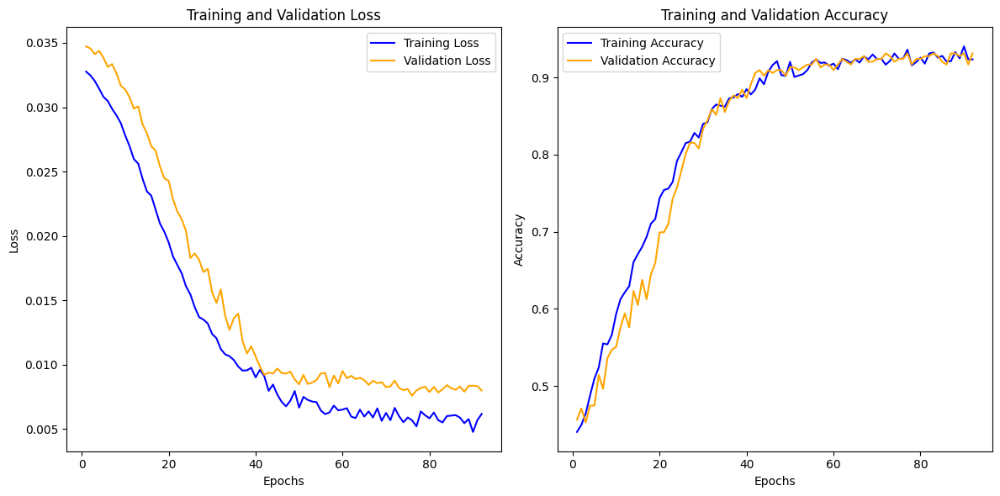

In [ ]:
# After the training loop
import matplotlib.pyplot as plt

# Plotting Training and Validation Loss
plt.figure(figsize=(12, 6))

# Plot Training Loss
plt.subplot(1, 2, 1)
plt.plot(range(1, len(train_loss) + 1), train_loss, label='Training Loss', color='blue')
plt.plot(range(1, len(val_loss) + 1), val_loss, label='Validation Loss', color='orange')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()

# Plot Training and Validation Accuracy
plt.subplot(1, 2, 2)
plt.plot(range(1, len(train_acc) + 1), train_acc, label='Training Accuracy', color='blue')
plt.plot(range(1, len(val_acc) + 1), val_acc, label='Validation Accuracy', color='orange')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()

plt.tight_layout()
plt.show()


In [ ]:
from sklearn.metrics import classification_report
print(classification_report(true_labels, predicted_labels, target_names=["dry", "normal", "oily"]))


NameError: name 'true_labels' is not defined

In [ ]:
import matplotlib.pyplot as plt

model.eval()
# Updated label_map to include all 3 categories
label_map = {0: "dry", 1: "normal", 2: "oily"}

# Recreate the DataLoader iterator
val_dl = DataLoader(val_dataset, batch_size=8, shuffle=True)
data_iter = iter(val_dl)
images, labels = next(data_iter)

# Move to device
images = images.to(device)
with torch.no_grad():
    outputs = model(images)
    preds = outputs.argmax(1)

# Move to CPU for plotting
images = images.cpu()
labels = labels.cpu()
preds = preds.cpu()

plt.figure(figsize=(12, 6))
for idx in range(8):  # Show 8 images
    img = images[idx].permute(1, 2, 0)

    # Unnormalize (using mean=[0.485, 0.456, 0.406] and std=[0.229, 0.224, 0.225] from transforms)
    img = img * torch.tensor([0.229, 0.224, 0.225]) + torch.tensor([0.485, 0.456, 0.406])
    img = img.clamp(0, 1)

    plt.subplot(2, 4, idx + 1)
    plt.imshow(img.numpy())
    plt.title(f"Pred: {label_map[preds[idx].item()]}\nTrue: {label_map[labels[idx].item()]}")
    plt.axis("off")

plt.tight_layout()
plt.show()

NameError: name 'model' is not defined

In [ ]:
from google.colab import files
uploaded = files.upload()  # Upload .pth and .zip here


Saving valid.zip to valid.zip


In [ ]:
import zipfile
import os

with zipfile.ZipFile("valid.zip", 'r') as zip_ref:
    zip_ref.extractall("val")


In [ ]:
import torchvision.models as models
import torch.nn as nn

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = models.resnet50(pretrained=False)
model.fc = nn.Sequential(
    nn.Dropout(0.3),
    nn.Linear(model.fc.in_features, 3)
)
model.load_state_dict(torch.load("skin_type_model2.pth", map_location=device))
model = model.to(device)
model.eval()


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [ ]:
from torchvision.datasets import ImageFolder
from torchvision import transforms
from torch.utils.data import DataLoader
import os
from PIL import Image

class CleanImageFolder(ImageFolder):
    def __getitem__(self, index):
        path, target = self.samples[index]
        try:
            sample = self.loader(path)
        except Exception as e:
            print(f"Skipping file: {path}")
            sample = Image.new('RGB', (224, 224))  # create a dummy image
        if self.transform is not None:
            sample = self.transform(sample)
        return sample, target

val_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

val_dataset = CleanImageFolder("val", transform=val_transform)
val_loader = DataLoader(val_dataset, batch_size=8, shuffle=True)


Skipping file: val/__MACOSX/valid/normal/._normal_01bc2817d6e0edb02bfd_jpg.rf.fe6ac17d4c4cf2cb5a60b1f210a5451c.jpg
Skipping file: val/__MACOSX/valid/normal/._normal_df87ce1a9b86af0ea405_jpg.rf.ea7258a63b62e98479817f73edd82770.jpg
Skipping file: val/__MACOSX/valid/dry/._dry_01a2f56b5d6099d2a71a_jpg.rf.f209155b50d6ffa91f31f801cc6ba21e.jpg


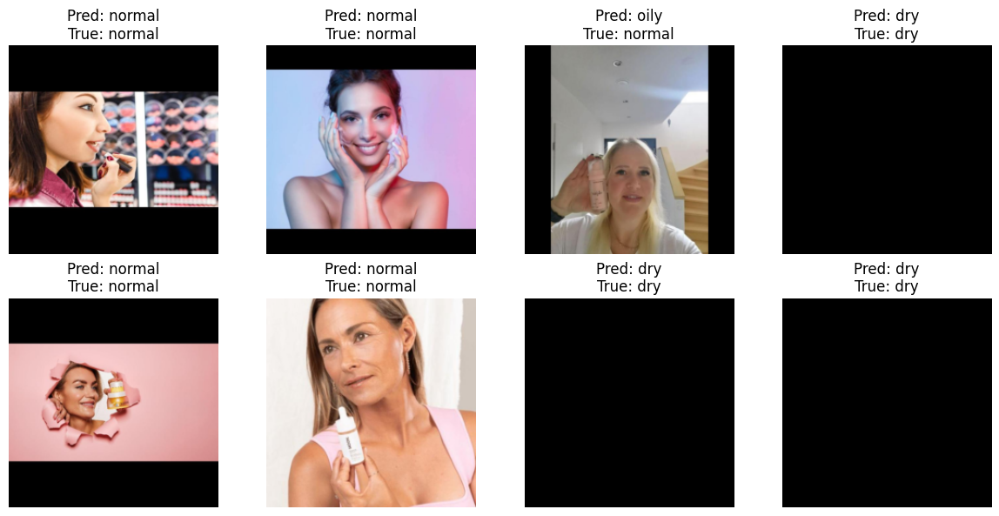

In [ ]:
import matplotlib.pyplot as plt

label_map = {0: "dry", 1: "normal", 2: "oily"}

images, labels = next(iter(val_loader))
images = images.to(device)

with torch.no_grad():
    outputs = model(images)
    preds = outputs.argmax(1)

images = images.cpu()
labels = labels.cpu()
preds = preds.cpu()

plt.figure(figsize=(12, 6))
for idx in range(8):
    img = images[idx].permute(1, 2, 0)
    img = img * torch.tensor([0.229, 0.224, 0.225]) + torch.tensor([0.485, 0.456, 0.406])
    img = img.clamp(0, 1)

    plt.subplot(2, 4, idx + 1)
    plt.imshow(img.numpy())
    plt.title(f"Pred: {label_map[preds[idx].item()]}\nTrue: {label_map[labels[idx].item()]}")
    plt.axis("off")

plt.tight_layout()
plt.show()


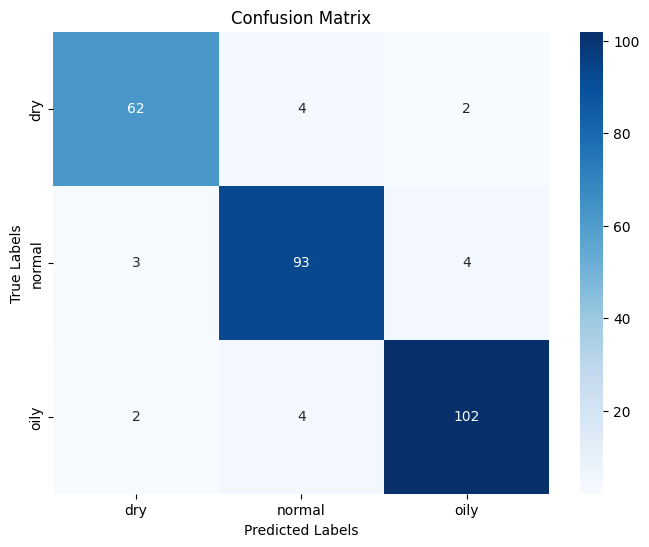

In [ ]:
import numpy as np
import torch
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Set the model to evaluation mode
model.eval()

# Initialize lists to store the true labels and predicted labels
true_labels = []
predicted_labels = []

# Iterate over the validation set
with torch.no_grad():
    for data, target in val_dl:
        data, target = data.to(device), target.to(device)
        outputs = model(data)
        preds = outputs.argmax(1)

        # Store the true and predicted labels
        true_labels.extend(target.cpu().numpy())
        predicted_labels.extend(preds.cpu().numpy())

# Compute the confusion matrix
cm = confusion_matrix(true_labels, predicted_labels)

# Plot the confusion matrix using seaborn
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=["dry", "normal", "oily"], yticklabels=["dry", "normal", "oily"])
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Confusion Matrix")
plt.show()


In [ ]:
from PIL import Image

def predict_skin_type(image_path, model, transform=None):
    # Set model to evaluation mode
    model.eval()

    # Open the image
    img = Image.open(image_path).convert('RGB')

    # Use the provided transform (or default to val_test_transforms)
    if transform is None:
        transform = val_test_transforms  # Use val_test_transforms if no transform is provided

    # Apply transformation to the image
    x = transform(img).unsqueeze(0).to(device)

    # Make prediction without tracking gradients
    with torch.no_grad():
        output = model(x)
        _, pred = torch.max(output, 1)  # Get predicted class (max output)

    # Return the predicted label (dry, normal, oily)
    return IDX_TO_LABEL[pred.item()]


In [ ]:
# Example usage
#image_path = "test.jpg"
#image_path = "test2.jpg"
#image_path = "test3.jpg"
image_path = "dry.jpeg"

predicted_skin_type = predict_skin_type(image_path, model)
print(f"The predicted skin type is: {predicted_skin_type}")


The predicted skin type is: dry


In [ ]:
import torch

# Suppose model_base is your trained PyTorch model
model.eval()

# Save entire model with state_dict
torch.save(model.state_dict(), "skin_type_model2.pth")
print("Model saved as skin_type_model2.pth")


Model saved as skin_type_model2.pth


In [ ]:
best_model_state_dict = deepcopy(model.state_dict())
best_acc = 0


train_loss = []
train_acc = []
val_loss = []
val_acc = []

for epoch in range(1, 30):
    model.train()

    diff = 0
    total = 0
    acc = 0

    for data, target in train_dl:
        optimizer.zero_grad()

        data, target = data.to(device), target.to(device)

        out = model(data)

        try:
            loss = criterion(out, target)
        except RuntimeError as e:
            print("Error calculating loss:", e)
            print("Data shape:", data.shape)
            print("Data min/max:", data.min(), data.max())
            print("Target values:", target)
            print("Target unique values:", torch.unique(target))
            raise  # Re-raise the error to stop training

        diff += loss.item()
        acc += (out.argmax(1) == target).sum().item()
        total += out.size(0)

        loss.backward()
        optimizer.step()

    train_loss.append(diff / total)
    train_acc.append(acc / total)

    # Validation step
    model.eval()

    diff = 0
    total = 0
    acc = 0

    with torch.no_grad():
        for data, target in val_dl:
            data, target = data.to(device), target.to(device)

            out = model(data)
            loss = criterion(out, target)
            diff += loss.item()
            acc += (out.argmax(1) == target).sum().item()
            total += out.size(0)

    val_loss.append(diff / total)
    val_acc.append(acc / total)

    # Save the best model
    if val_acc[-1] > best_acc:
        best_acc = val_acc[-1]
        best_model = deepcopy(model)

    # Step the learning rate scheduler
    scheduler.step()

    print(f"Epoch {epoch}, Train Loss: {train_loss[-1]:.4f}, Train Acc: {train_acc[-1]:.4f}, Val Loss: {val_loss[-1]:.4f}, Val Acc: {val_acc[-1]:.4f}")


KeyboardInterrupt: 

In [ ]:
# Training loop with early stopping
train_loss = []
train_acc = []
val_loss = []
val_acc = []

best_acc = 0
best_model_state_dict = deepcopy(model.state_dict())
patience = 20
trigger_times = 0

for epoch in range(1, 1000):
    model.train()
    running_loss = 0
    correct = 0
    total = 0

    for data, target in train_dl:
        data, target = data.to(device), target.to(device)
        optimizer.zero_grad()
        out = model(data)
        loss = criterion(out, target)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()
        correct += (out.argmax(1) == target).sum().item()
        total += target.size(0)

    train_loss.append(running_loss / total)
    train_acc.append(correct / total)

    # Validation
    model.eval()
    val_running_loss = 0
    val_correct = 0
    val_total = 0

    with torch.no_grad():
        for data, target in val_dl:
            data, target = data.to(device), target.to(device)
            out = model(data)
            loss = criterion(out, target)
            val_running_loss += loss.item()
            val_correct += (out.argmax(1) == target).sum().item()
            val_total += target.size(0)

    val_loss.append(val_running_loss / val_total)
    val_acc.append(val_correct / val_total)

    # Early stopping
    if val_acc[-1] > best_acc:
        best_acc = val_acc[-1]
        best_model_state_dict = deepcopy(model.state_dict())
        trigger_times = 0
    else:
        trigger_times += 1
        if trigger_times >= patience:
            print(f"Early stopping at epoch {epoch}")
            break

    scheduler.step()

    print(f"Epoch {epoch}, Train Loss: {train_loss[-1]:.4f}, Acc: {train_acc[-1]:.4f}, Val Loss: {val_loss[-1]:.4f}, Acc: {val_acc[-1]:.4f}")


Epoch 1, Train Loss: 0.0337, Acc: 0.3943, Val Loss: 0.0350, Acc: 0.4312
Epoch 2, Train Loss: 0.0334, Acc: 0.4297, Val Loss: 0.0348, Acc: 0.4384
Epoch 3, Train Loss: 0.0332, Acc: 0.4415, Val Loss: 0.0345, Acc: 0.4529
Epoch 4, Train Loss: 0.0332, Acc: 0.4356, Val Loss: 0.0346, Acc: 0.4529
Epoch 5, Train Loss: 0.0330, Acc: 0.4424, Val Loss: 0.0344, Acc: 0.4638
Epoch 6, Train Loss: 0.0327, Acc: 0.4483, Val Loss: 0.0343, Acc: 0.4674
Epoch 7, Train Loss: 0.0326, Acc: 0.4578, Val Loss: 0.0342, Acc: 0.4746
Epoch 8, Train Loss: 0.0325, Acc: 0.4673, Val Loss: 0.0344, Acc: 0.4819
Epoch 9, Train Loss: 0.0325, Acc: 0.4560, Val Loss: 0.0342, Acc: 0.4783
Epoch 10, Train Loss: 0.0325, Acc: 0.4614, Val Loss: 0.0341, Acc: 0.4746
Epoch 11, Train Loss: 0.0327, Acc: 0.4442, Val Loss: 0.0341, Acc: 0.4638
Epoch 12, Train Loss: 0.0325, Acc: 0.4564, Val Loss: 0.0340, Acc: 0.4710
Epoch 13, Train Loss: 0.0322, Acc: 0.4601, Val Loss: 0.0341, Acc: 0.4674
Epoch 14, Train Loss: 0.0322, Acc: 0.4537, Val Loss: 0.0341,

In [ ]:
# Load best model
model.load_state_dict(best_model_state_dict)

<All keys matched successfully>

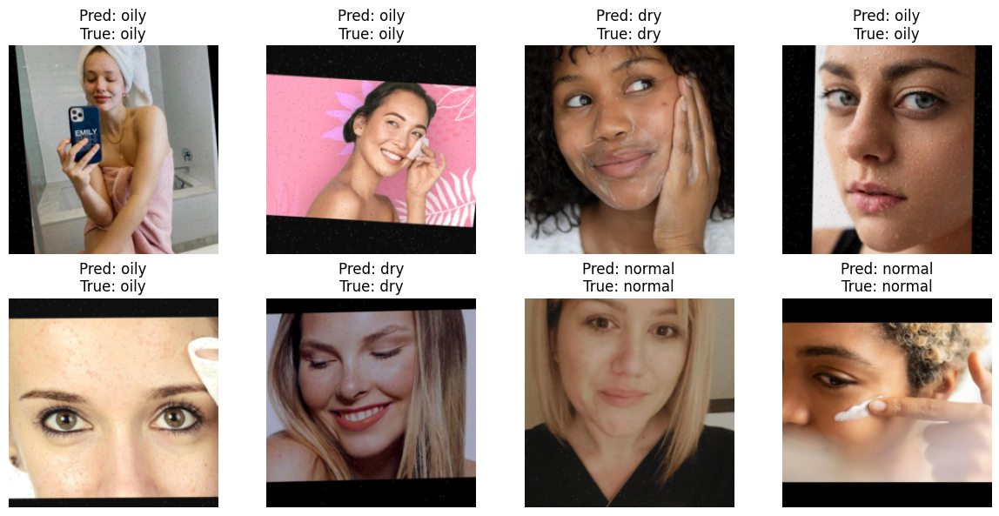

In [ ]:
import matplotlib.pyplot as plt

model.eval()
# Updated label_map to include all 3 categories
label_map = {0: "dry", 1: "normal", 2: "oily"}

# Recreate the DataLoader iterator
data_iter = iter(val_dl)
images, labels = next(data_iter)

# Move to device
images = images.to(device)
with torch.no_grad():
    outputs = model(images)
    preds = outputs.argmax(1)

# Move to CPU for plotting
images = images.cpu()
labels = labels.cpu()
preds = preds.cpu()

plt.figure(figsize=(12, 6))
for idx in range(8):  # Show 8 images
    img = images[idx].permute(1, 2, 0)

    # Unnormalize (using mean=[0.485, 0.456, 0.406] and std=[0.229, 0.224, 0.225] from transforms)
    img = img * torch.tensor([0.229, 0.224, 0.225]) + torch.tensor([0.485, 0.456, 0.406])
    img = img.clamp(0, 1)

    plt.subplot(2, 4, idx + 1)
    plt.imshow(img.numpy())
    plt.title(f"Pred: {label_map[preds[idx].item()]}\nTrue: {label_map[labels[idx].item()]}")  # Now uses the corrected label_map
    plt.axis("off")

plt.tight_layout()
plt.show()

In [ ]:
import os
import numpy as np
import pandas as pd
from PIL import Image

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as T
import torchvision.models as models
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

import matplotlib.pyplot as plt
import seaborn as sns


In [ ]:
import os
from google.colab import files

# 1) Prompt the user to upload a zip file
uploaded = files.upload()
# After running this cell, select the .zip file on your local machine.

# 2) Extract the name of the uploaded file
zip_filename = next(iter(uploaded.keys()))
print(f"Uploaded file: {zip_filename}")

# 3) Unzip to a folder, e.g. /content/dataset
!unzip -q "{zip_filename}" -d /content/dataset

# 4) Check the extracted directories
print("Contents of /content/dataset:")
!ls /content/dataset


Saving archive (6).zip to archive (6).zip
Uploaded file: archive (6).zip
Contents of /content/dataset:
Oily-Dry-Skin-Types


In [ ]:
import pandas as pd
import os

LABEL_TO_IDX = {"dry": 0, "normal": 1, "oily": 2}

def build_dataframe(base_dir):
    """
    Creates a DataFrame with columns: [image_path, label_idx].
    Expects subfolders in base_dir named 'dry', 'normal', 'oily'.
    """
    filepaths = []
    labels = []
    for label_name in os.listdir(base_dir):
        # e.g. label_name = 'dry' or 'normal' or 'oily'
        subfolder = os.path.join(base_dir, label_name)
        if not os.path.isdir(subfolder):
            continue
        for fname in os.listdir(subfolder):
            if fname.lower().endswith(('.jpg', '.png', '.jpeg')):
                fpath = os.path.join(subfolder, fname)
                filepaths.append(fpath)
                labels.append(LABEL_TO_IDX[label_name])
    return pd.DataFrame({"image_path": filepaths, "label_idx": labels})

# Example usage:
train_path = "/content/dataset/Oily-Dry-Skin-Types/train"  # Adjust if your folder is named differently
val_path   = "/content/dataset/Oily-Dry-Skin-Types/valid"
test_path  = "/content/dataset/Oily-Dry-Skin-Types/test"

train_df = build_dataframe(train_path)
val_df   = build_dataframe(val_path)
test_df  = build_dataframe(test_path)

print("Train shape:", train_df.shape)
print("Val shape:", val_df.shape)
print("Test shape:", test_df.shape)

# If everything worked, you should see your DataFrame shapes printed out
# and no more FileNotFoundError issues.


Train shape: (2756, 2)
Val shape: (262, 2)
Test shape: (134, 2)


In [ ]:
# 2) Dataset & DataLoader
###############################################################################
class SkinTypeDataset(Dataset):
    def __init__(self, dataframe, transform=None):
        super().__init__()
        self.dataframe = dataframe.reset_index(drop=True)
        self.transform = transform

    def __len__(self):
        return len(self.dataframe)

    def __getitem__(self, idx):
        row = self.dataframe.iloc[idx]
        img_path = row['image_path']
        label = row['label_idx']

        # Read image
        image = Image.open(img_path).convert("RGB")
        if self.transform:
            image = self.transform(image)

        return image, label



In [ ]:
# Transforms: you can add more data augmentation to make it look unique
IMG_SIZE = 224
train_transform = T.Compose([
    T.Resize((IMG_SIZE, IMG_SIZE)),
    T.RandomHorizontalFlip(p=0.5),
    T.RandomVerticalFlip(p=0.3),
    T.RandomRotation(15),
    T.ColorJitter(brightness=0.2, contrast=0.2),
    T.ToTensor(),
    T.Normalize(mean=[0.485, 0.456, 0.406],
                std=[0.229, 0.224, 0.225])
])

val_transform = T.Compose([
    T.Resize((IMG_SIZE, IMG_SIZE)),
    T.ToTensor(),
    T.Normalize(mean=[0.485, 0.456, 0.406],
                std=[0.229, 0.224, 0.225])
])

train_dataset = SkinTypeDataset(train_df, transform=train_transform)
val_dataset   = SkinTypeDataset(val_df,   transform=val_transform)
test_dataset  = SkinTypeDataset(test_df,  transform=val_transform)

BATCH_SIZE = 32
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=2)
val_loader   = DataLoader(val_dataset,   batch_size=BATCH_SIZE, shuffle=False, num_workers=2)
test_loader  = DataLoader(test_dataset,  batch_size=BATCH_SIZE, shuffle=False, num_workers=2)


In [ ]:
# 3) Model Definition
###############################################################################
# Use ResNet50 as a base; you can also try MobileNet, EfficientNet, or any TIMM models
model_base = models.resnet50(weights=models.ResNet50_Weights.IMAGENET1K_V2)
num_features = model_base.fc.in_features

# Replace the final FC layer for our 3 classes
#model_base.fc = nn.Linear(num_features, 3)  # 3 classes: dry, normal, oily
model_base.fc = nn.Sequential(
    nn.Dropout(p=0.5),
    nn.Linear(num_features, 256),
    nn.ReLU(inplace=True),
    nn.Dropout(p=0.3),
    nn.Linear(256, 3)  # Assuming we have 3 classes (dry, normal, oily)
)

device = "cuda" if torch.cuda.is_available() else "cpu"
model_base = model_base.to(device)


In [ ]:

# 4) Training Loop
###############################################################################
EPOCHS = 30
LR = 0.0005
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model_base.parameters(), lr=LR)
# Optional learning rate scheduler
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)

best_model_wts = None
best_val_acc = 0.0

train_loss_history = []
train_acc_history = []
val_loss_history   = []
val_acc_history    = []

for epoch in range(EPOCHS):
    #################################
    # 4.1) Training phase
    #################################
    model_base.train()
    running_loss = 0.0
    running_corrects = 0
    total_samples = 0

    for images, labels in train_loader:
        images, labels = images.to(device), labels.to(device)
        optimizer.zero_grad()

        outputs = model_base(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        # stats
        _, preds = torch.max(outputs, 1)
        running_loss += loss.item() * images.size(0)
        running_corrects += torch.sum(preds == labels).item()
        total_samples += images.size(0)

    epoch_train_loss = running_loss / total_samples
    epoch_train_acc  = running_corrects / total_samples

    train_loss_history.append(epoch_train_loss)
    train_acc_history.append(epoch_train_acc)

    #################################
    # 4.2) Validation phase
    #################################
    model_base.eval()
    val_loss = 0.0
    val_corrects = 0
    val_samples = 0

    with torch.no_grad():
        for images, labels in val_loader:
            images, labels = images.to(device), labels.to(device)

            outputs = model_base(images)
            loss = criterion(outputs, labels)

            _, preds = torch.max(outputs, 1)
            val_loss += loss.item() * images.size(0)
            val_corrects += torch.sum(preds == labels).item()
            val_samples += images.size(0)

    epoch_val_loss = val_loss / val_samples
    epoch_val_acc  = val_corrects / val_samples

    val_loss_history.append(epoch_val_loss)
    val_acc_history.append(epoch_val_acc)

    # Check if this is the best model so far
    if epoch_val_acc > best_val_acc:
        best_val_acc = epoch_val_acc
        best_model_wts = model_base.state_dict()

    scheduler.step()

    print(f"Epoch {epoch+1}/{EPOCHS} "
          f"Train Loss: {epoch_train_loss:.4f} Acc: {epoch_train_acc:.4f} | "
          f"Val Loss: {epoch_val_loss:.4f} Acc: {epoch_val_acc:.4f}")

# After training
if best_model_wts is not None:
    model_base.load_state_dict(best_model_wts)
    print(f"Loaded best model weights with val acc = {best_val_acc:.4f}")


Epoch 1/30 Train Loss: 1.0600 Acc: 0.4332 | Val Loss: 1.1203 Acc: 0.3359
Epoch 2/30 Train Loss: 0.9677 Acc: 0.5200 | Val Loss: 1.1991 Acc: 0.3321
Epoch 3/30 Train Loss: 0.8405 Acc: 0.6089 | Val Loss: 1.7618 Acc: 0.3626
Epoch 4/30 Train Loss: 0.7506 Acc: 0.6705 | Val Loss: 1.7130 Acc: 0.4046
Epoch 5/30 Train Loss: 0.6412 Acc: 0.7300 | Val Loss: 1.5897 Acc: 0.4160
Epoch 6/30 Train Loss: 0.5350 Acc: 0.7798 | Val Loss: 3.4126 Acc: 0.3130
Epoch 7/30 Train Loss: 0.4908 Acc: 0.8015 | Val Loss: 1.9505 Acc: 0.4160
Epoch 8/30 Train Loss: 0.2685 Acc: 0.9060 | Val Loss: 1.9869 Acc: 0.4046
Epoch 9/30 Train Loss: 0.1626 Acc: 0.9463 | Val Loss: 2.2218 Acc: 0.4198
Epoch 10/30 Train Loss: 0.1441 Acc: 0.9525 | Val Loss: 2.3960 Acc: 0.4237
Epoch 11/30 Train Loss: 0.1169 Acc: 0.9583 | Val Loss: 2.4744 Acc: 0.4008
Epoch 12/30 Train Loss: 0.0995 Acc: 0.9634 | Val Loss: 2.6888 Acc: 0.3855
Epoch 13/30 Train Loss: 0.0817 Acc: 0.9750 | Val Loss: 2.8720 Acc: 0.4008
Epoch 14/30 Train Loss: 0.0803 Acc: 0.9724 | Va

In [ ]:
# early stapping + 1000 epoci

# over sapling - smote

# after smote tech score f1 nu acuratetea


Test Accuracy: 0.4925373134328358
              precision    recall  f1-score   support

         dry       0.31      0.40      0.35        35
      normal       0.64      0.66      0.65        59
        oily       0.46      0.33      0.38        40

    accuracy                           0.49       134
   macro avg       0.47      0.46      0.46       134
weighted avg       0.50      0.49      0.49       134



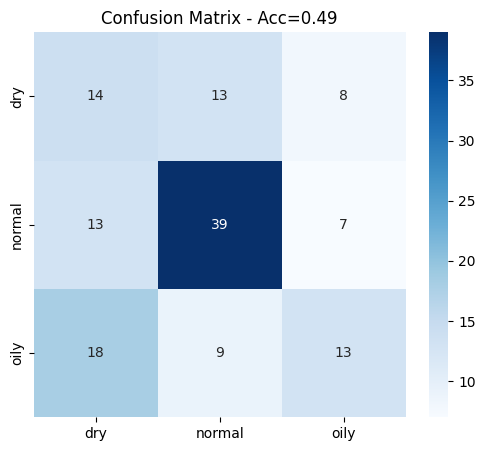

In [ ]:
# 5) Evaluation on Test Set
###############################################################################
model_base.eval()
all_preds = []
all_truth = []

with torch.no_grad():
    for images, labels in test_loader:
        images, labels = images.to(device), labels.to(device)
        outputs = model_base(images)
        _, preds = torch.max(outputs, 1)
        all_preds.extend(preds.cpu().numpy())
        all_truth.extend(labels.cpu().numpy())

acc = accuracy_score(all_truth, all_preds)
print("Test Accuracy:", acc)
print(classification_report(all_truth, all_preds, target_names=list(LABEL_TO_IDX.keys())))

# Confusion matrix
cm = confusion_matrix(all_truth, all_preds)
plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
            xticklabels=LABEL_TO_IDX.keys(), yticklabels=LABEL_TO_IDX.keys())
plt.title(f"Confusion Matrix - Acc={acc:.2f}")
plt.show()


In [ ]:
# 6) Helper function to predict on a single image
###############################################################################
def predict_skin_type(image_path, model, transform=val_transform):
    """
    Predict the skin type given an image_path.
    """
    model.eval()
    img = Image.open(image_path).convert('RGB')
    x = transform(img).unsqueeze(0).to(device)
    with torch.no_grad():
        output = model(x)
        _, pred = torch.max(output, 1)
    return IDX_TO_LABEL[pred.item()]

# Example usage:
# predicted_type = predict_skin_type("/path/to/some_image.jpg", model_base)
# print("Predicted skin type:", predicted_type)

In [ ]:
predicted_type = predict_skin_type("oily.jpg", model_base)
print("Predicted skin type:", predicted_type)

Predicted skin type: oily


In [ ]:
predicted_type = predict_skin_type("dry.jpeg", model_base)
print("Predicted skin type:", predicted_type)

Predicted skin type: dry


In [ ]:
predicted_type = predict_skin_type("nr.jpg", model_base)
print("Predicted skin type:", predicted_type)

Predicted skin type: normal


In [ ]:
final_ingredient_string

'aqua/water, glycerin, cetearyl alcoholcaprylicicapric triglyceride cetyl alcohol, ceteareth-20, petrolatum, potassium phosphate, ceramide np, ceramide ap, ceramide eop, carbomer, dimethicone, behentrimonium methosulfate, sodium bauroyl lactylate sodiumhyaluronate cholesterol, phenoxyethanol, disodium edta, dipotassium phosphate tocopherol phytosphingosine, xanthan gum, ethylhexylglycerine.'

In [ ]:
final_ingredient_list

['aqua/water',
 'glycerin',
 'cetearyl alcoholcaprylicicapric triglyceride cetyl alcohol',
 'ceteareth-20',
 'petrolatum',
 'potassium phosphate',
 'ceramide np',
 'ceramide ap',
 'ceramide eop',
 'carbomer',
 'dimethicone',
 'behentrimonium methosulfate',
 'sodium bauroyl lactylate sodiumhyaluronate cholesterol',
 'phenoxyethanol',
 'disodium edta',
 'dipotassium phosphate tocopherol phytosphingosine',
 'xanthan gum',
 'ethylhexylglycerine.']

In [ ]:
# Example knowledge base for ingredients vs. skin type.
# This is obviously simplified; you'd want more complete data for a real project.
INGREDIENT_GUIDE = {
    "dry": {
        "recommended": ["hyaluronic acid", "glycerin", "ceramides", "squalane"],
        "avoid": ["salicylic acid", "benzoyl peroxide", "fragrance"]
    },
    "oily": {
        "recommended": ["salicylic acid", "niacinamide", "benzoyl peroxide"],
        "avoid": ["mineral oil", "coconut oil"]
    },
    "normal": {
        "recommended": ["hyaluronic acid", "niacinamide", "glycerin"],
        "avoid": []
    }
}

def analyze_product_for_skin_type(predicted_type, ingredients):
    """
    Given the user's predicted skin type (dry, normal, oily) and a
    list of extracted ingredients from OCR, show how suitable
    the product might be.
    """
    recommended_list = INGREDIENT_GUIDE[predicted_type]["recommended"]
    avoid_list = INGREDIENT_GUIDE[predicted_type]["avoid"]

    # Identify if the product has recommended or avoid ingredients
    present_recommended = [ing for ing in ingredients if ing.lower() in recommended_list]
    present_avoid = [ing for ing in ingredients if ing.lower() in avoid_list]

    # Basic logic to produce a summary
    summary = f"For {predicted_type.upper()} skin:\n"
    if present_recommended:
        summary += f" - Good ingredients found: {', '.join(present_recommended)}.\n"
    if present_avoid:
        summary += f" - Potentially problematic ingredients found: {', '.join(present_avoid)}.\n"
    if not present_recommended and not present_avoid:
        summary += " - No major recommended or problematic ingredients detected.\n"

    # You could add a final rating or more nuanced logic here
    return summary

# Suppose we have:
predicted_skin_type = "dry"  # example from classification
extracted_ingredients = ["water", "glycerin", "salicylic acid", "fragrance"]

analysis = analyze_product_for_skin_type(predicted_skin_type, final_ingredient_list)
print(analysis)


For DRY skin:
 - Good ingredients found: glycerin.

